In [3]:
import multiqc
import IPython
import os
import pandas as pd
from IPython.display import HTML


In [4]:
def env_var(envar, var):
    import os
    os.environ[envar] = var
    return


def is_gzipped_content(file_path):
    try:
        with open(file_path, 'rb') as f:
            # Read the first two bytes to check for the gzip magic number
            magic_number = f.read(2)
            return magic_number == b'\x1f\x8b'
    except OSError:
        return False
    
    
#print(refGenomePath)
#jobIdxPE + '/RefGenome.fa'
def decompress_gzipped(org, dest):
    os.system('gzip -d ' + org + ' -c > ' + dest)
    return
#refGenomePath = jobIdxPE + '/RefGenome.fa'
    

RNA Seq - Pipeline definition
========================
- RNA Seq for H. Sapiens and subsampled SRAs,  R. Yockteng and [DIY transcriptomics Labs](https://diytranscriptomics.com/lab/).
- RNA Seq for samples Paired-end subsampled (ldelgadillo, ryockteng)
Pipeline adapted for Paired-end and Single-end Illumina reads.

## Data



### Paired End Data



In [5]:
PEPath = "/mnt/d/PE/Avena/"
jobIdxPE = "AvenaSub1.5M-RNASeq-PE"
env_var("rnaidx-PE", jobIdxPE)

In [8]:
os.chdir("/mnt/d/PE/Avena/")


## Metadata file

File used to import data files and associate filenames with features and data type, must be on CSV format, according with experiment user could add or delete columns(metaN column), mandatory columns are file name file type(single, paired)



### Paired End Metadata

Metadata file were located on PE working directory, file name `sub1M_PE_metadata_template.csv`

In [9]:
#metaPE = pd.read_csv(PEPath + "AvenaSub1.5M_PE_metadata.csv", sep = ';')
#jobIdxPE + "/metadata.csv", sep = ",", header = True, index = False
metaPE = pd.read_csv(jobIdxPE + "/metadata.csv", sep = ",")
display(metaPE)

,file1,file2,type,shortName,meta1,meta2,meta3,replicate,trimmed1,trimmed2
0,sub1.5M-Ctrl_Estres_R1_1.fastq.gz,sub1.5M-Ctrl_Estres_R1_2.fastq.gz,paired,cont_estres_R1,Estres,Inoculado,A,1,sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz
1,sub1.5M-Ctrl_Estres_R2_1.fastq.gz,sub1.5M-Ctrl_Estres_R2_2.fastq.gz,paired,cont_estres_R2,Estres,Inoculado,A,2,sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R2_2_paired.fastq.gz
2,sub1.5M-Ctrll_Estres_R3_1.fastq.gz,sub1.5M-Ctrll_Estres_R3_2.fastq.gz,paired,cont_estres_R3,Estres,Inoculado,A,3,sub1.5M-Ctrll_Estres_R3_1_paired.fastq.gz,sub1.5M-Ctrll_Estres_R3_2_paired.fastq.gz
3,sub1.5M-Control_R1_1.fastq.gz,sub1.5M-Control_R1_2.fastq.gz,paired,control_R1,Control,No_inoculado,B,1,sub1.5M-Control_R1_1_paired.fastq.gz,sub1.5M-Control_R1_2_paired.fastq.gz
4,sub1.5M-Control_R2_1.fastq.gz,sub1.5M-Control_R2_2.fastq.gz,paired,control_R2,Control,No_inoculado,B,2,sub1.5M-Control_R2_1_paired.fastq.gz,sub1.5M-Control_R2_2_paired.fastq.gz
5,sub1.5M-Ctrl_N7_XT17_R1_1.fastq.gz,sub1.5M-Ctrl_N7_XT17_R1_2.fastq.gz,paired,ctrl_N7_XT17_R1,Control,Inoculado,C,1,sub1.5M-Ctrl_N7_XT17_R1_1_paired.fastq.gz,sub1.5M-Ctrl_N7_XT17_R1_2_paired.fastq.gz
6,sub1.5M-Ctrl_N7_XT17_R2_1.fastq.gz,sub1.5M-Ctrl_N7_XT17_R2_2.fastq.gz,paired,ctrl_N7_XT17_R2,Control,Inoculado,C,2,sub1.5M-Ctrl_N7_XT17_R2_1_paired.fastq.gz,sub1.5M-Ctrl_N7_XT17_R2_2_paired.fastq.gz
7,sub1.5M-Ctrl_N7_XT17_R3_1.fastq.gz,sub1.5M-Ctrl_N7_XT17_R3_2.fastq.gz,paired,ctrl_N7_XT17_R3,Control,Inoculado,C,3,sub1.5M-Ctrl_N7_XT17_R3_1_paired.fastq.gz,sub1.5M-Ctrl_N7_XT17_R3_2_paired.fastq.gz
8,sub1.5M-Estre_N7XT17_R1_1.fastq.gz,sub1.5M-Estre_N7XT17_R1_2.fastq.gz,paired,estres_N7_XT17_R1,Estres,No_inoculado,D,1,sub1.5M-Estre_N7XT17_R1_1_paired.fastq.gz,sub1.5M-Estre_N7XT17_R1_2_paired.fastq.gz
9,sub1.5M-Estre_N7XT17_R2_1.fastq.gz,sub1.5M-Estre_N7XT17_R2_2.fastq.gz,paired,estres_N7_XT17_R2,Estres,No_inoculado,D,2,sub1.5M-Estre_N7XT17_R2_1_paired.fastq.gz,sub1.5M-Estre_N7XT17_R2_2_paired.fastq.gz


## Quality Control

1. Check Quality for FASTQ files with [FASTQC](https://www.bioinformatics.babraham.ac.uk/projects/fastqc/)
2. Run [MultiQC]() for a better visualization
3. Define trimming parameters
4. Run [Trimmomatic](https://www.usadellab.org/cms/?page=trimmomatic)
5. Check Trimming again, running steps 1. and 2.



### 1. Quality Check



In [8]:
help("multiqc.run")

Help on function run in multiqc:

multiqc.run = run(analysis_dir, dirs=False, dirs_depth=None, no_clean_sname=False, title=None, report_comment=None, template=None, module=(), require_logs=False, exclude=(), outdir=None, ignore=(), ignore_samples=(), use_filename_as_sample_name=False, replace_names=None, sample_names=None, sample_filters=None, file_list=False, filename=None, make_data_dir=False, no_data_dir=False, data_format=None, zip_data_dir=False, force=True, ignore_symlinks=False, no_report=False, export_plots=False, plots_flat=False, plots_interactive=False, strict=False, lint=False, development=False, make_pdf=False, no_megaqc_upload=False, config_file=(), cl_config=(), verbose=0, quiet=False, profile_runtime=False, no_ansi=False, custom_css_files=(), **kwargs)
    MultiQC aggregates results from bioinformatics analyses across many samples into a single report.

    It searches a given directory for analysis logs and compiles a HTML report.
    It's a general use tool, perfect f

#### Paired End QC

In [9]:
os.chdir(PEPath)
!ls -ltrh

total 4.8G
-rwxrwxrwx 1 ddelgadillo ddelgadillo   94 May 29 22:00 TruSeq3-PE.fa
-rwxrwxrwx 1 ddelgadillo ddelgadillo  478 Jul  4 09:45 Avena_codata.csv
-rwxrwxrwx 1 ddelgadillo ddelgadillo 117M Jul  4 09:50 sub1.5M-Estre_N7XT17_R3_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 111M Jul  4 09:51 sub1.5M-Estre_N7XT17_R3_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 115M Jul  4 09:51 sub1.5M-Estre_N7XT17_R2_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 108M Jul  4 09:52 sub1.5M-Estre_N7XT17_R2_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 118M Jul  4 09:52 sub1.5M-Estre_N7XT17_R1_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 110M Jul  4 09:53 sub1.5M-Estre_N7XT17_R1_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 115M Jul  4 09:54 sub1.5M-Ctrl_N7_XT17_R3_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 109M Jul  4 09:54 sub1.5M-Ctrl_N7_XT17_R3_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 114M Jul  4 09:55 sub1.5M-Ctrl_N7_XT17_R2_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 1

In [10]:
!mkdir -p $jobIdxPE'/01-QC-Pre-Reports/'
!fastqc -o $jobIdxPE'/01-QC-Pre-Reports/' *.fastq.gz -t 8 --nogroup

application/gzip
Started analysis of sub1.5M-Control_R1_1.fastq.gz
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
Started analysis of sub1.5M-Control_R1_2.fastq.gz
Started analysis of sub1.5M-Control_R2_1.fastq.gz
Started analysis of sub1.5M-Control_R2_2.fastq.gz
Started analysis of sub1.5M-Ctrl_Estres_R1_1.fastq.gz
Started analysis of sub1.5M-Ctrl_Estres_R1_2.fastq.gz
Started analysis of sub1.5M-Ctrl_Estres_R2_1.fastq.gz
Started analysis of sub1.5M-Ctrl_Estres_R2_2.fastq.gz
Approx 5% complete for sub1.5M-Control_R1_1.fastq.gz
Approx 5% complete for sub1.5M-Control_R1_2.fastq.gz
Approx 5% complete for sub1.5M-Control_R2_1.fastq.gz
Approx 5% complete for sub1.5M-Control_R2_2.fastq.g

Approx 90% complete for sub1.5M-Control_R1_1.fastq.gz
Approx 85% complete for sub1.5M-Control_R2_2.fastq.gz
Approx 90% complete for sub1.5M-Control_R2_1.fastq.gz
Approx 90% complete for sub1.5M-Ctrl_Estres_R1_1.fastq.gz
Approx 85% complete for sub1.5M-Ctrl_Estres_R1_2.fastq.gz
Approx 85% complete for sub1.5M-Ctrl_Estres_R2_2.fastq.gz
Approx 90% complete for sub1.5M-Ctrl_Estres_R2_1.fastq.gz
Approx 90% complete for sub1.5M-Control_R1_2.fastq.gz
Approx 95% complete for sub1.5M-Control_R1_1.fastq.gz
Approx 90% complete for sub1.5M-Control_R2_2.fastq.gz
Approx 95% complete for sub1.5M-Control_R2_1.fastq.gz
Approx 95% complete for sub1.5M-Ctrl_Estres_R1_1.fastq.gz
Approx 90% complete for sub1.5M-Ctrl_Estres_R1_2.fastq.gz
Approx 90% complete for sub1.5M-Ctrl_Estres_R2_2.fastq.gz
Approx 95% complete for sub1.5M-Ctrl_Estres_R2_1.fastq.gz
Approx 95% complete for sub1.5M-Control_R1_2.fastq.gz
Analysis complete for sub1.5M-Control_R1_1.fastq.gz
Approx 95% complete for sub1.5M-Control_R2_2.fastq.g

Approx 65% complete for sub1.5M-Ctrl_N7_XT17_R2_2.fastq.gz
Approx 65% complete for sub1.5M-Ctrll_Estres_R3_1.fastq.gz
Approx 65% complete for sub1.5M-Ctrl_N7_XT17_R3_2.fastq.gz
Approx 60% complete for sub1.5M-Ctrll_Estres_R3_2.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_N7_XT17_R1_2.fastq.gz
Approx 70% complete for sub1.5M-Ctrl_N7_XT17_R3_1.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_N7_XT17_R1_1.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_N7_XT17_R2_1.fastq.gz
Approx 70% complete for sub1.5M-Ctrl_N7_XT17_R2_2.fastq.gz
Approx 70% complete for sub1.5M-Ctrll_Estres_R3_1.fastq.gz
Approx 70% complete for sub1.5M-Ctrl_N7_XT17_R3_2.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_N7_XT17_R1_2.fastq.gz
Approx 65% complete for sub1.5M-Ctrll_Estres_R3_2.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_N7_XT17_R3_1.fastq.gz
Approx 85% complete for sub1.5M-Ctrl_N7_XT17_R1_1.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_N7_XT17_R2_1.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_N7_XT17_R2_2.fastq.

Approx 60% complete for sub1.5M-Estre_N7XT17_R3_2.fastq.gz
Approx 65% complete for sub1.5M-Estre_N7XT17_R2_2.fastq.gz
Approx 65% complete for sub1.5M-Estre_N7XT17_R3_1.fastq.gz
Approx 70% complete for sub1.5M-Estre_N7XT17_R1_2.fastq.gz
Approx 75% complete for sub1.5M-Estre_N7XT17_R2_1.fastq.gz
Approx 80% complete for sub1.5M-Estre_N7XT17_R1_1.fastq.gz
Approx 65% complete for sub1.5M-Estre_N7XT17_R3_2.fastq.gz
Approx 70% complete for sub1.5M-Estre_N7XT17_R2_2.fastq.gz
Approx 70% complete for sub1.5M-Estre_N7XT17_R3_1.fastq.gz
Approx 75% complete for sub1.5M-Estre_N7XT17_R1_2.fastq.gz
Approx 80% complete for sub1.5M-Estre_N7XT17_R2_1.fastq.gz
Approx 85% complete for sub1.5M-Estre_N7XT17_R1_1.fastq.gz
Approx 75% complete for sub1.5M-Estre_N7XT17_R2_2.fastq.gz
Approx 70% complete for sub1.5M-Estre_N7XT17_R3_2.fastq.gz
Approx 75% complete for sub1.5M-Estre_N7XT17_R3_1.fastq.gz
Approx 85% complete for sub1.5M-Estre_N7XT17_R2_1.fastq.gz
Approx 80% complete for sub1.5M-Estre_N7XT17_R1_2.fastq.

/// ]8;id=632219;https://multiqc.info\MultiQC]8;;\ 🔍 | v1.21

|           multiqc | MultiQC Version v1.23 now available!
|           multiqc | Search path : /mnt/d/PE/Avena/AvenaSub1.5M-RNASeq-PE/01-QC-Pre-Reports


Output()

|            fastqc | Found 22 reports
|           multiqc | Report      : AvenaSub1.5M-RNASeq-PE/01-QC-Pre-Reports/multiqc_report.html   (overwritten)
|           multiqc | Data        : AvenaSub1.5M-RNASeq-PE/01-QC-Pre-Reports/multiqc_data   (overwritten)
|           multiqc | MultiQC complete



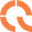
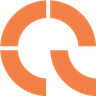
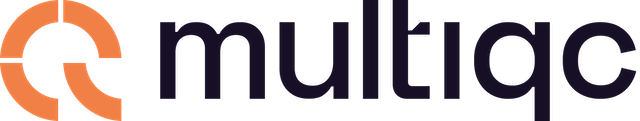
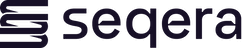
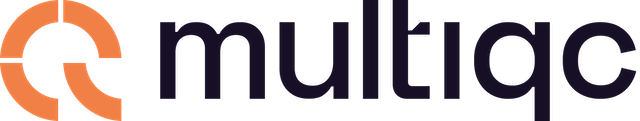
...
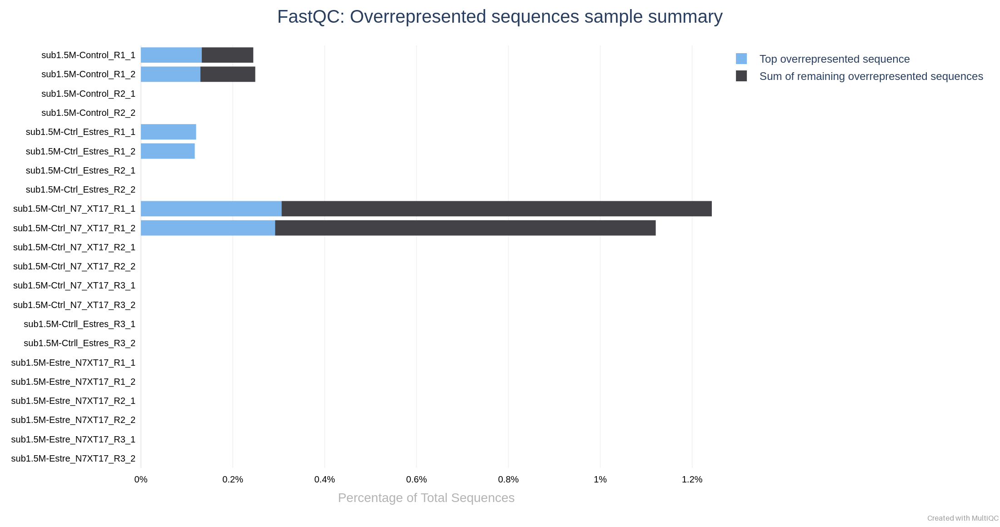
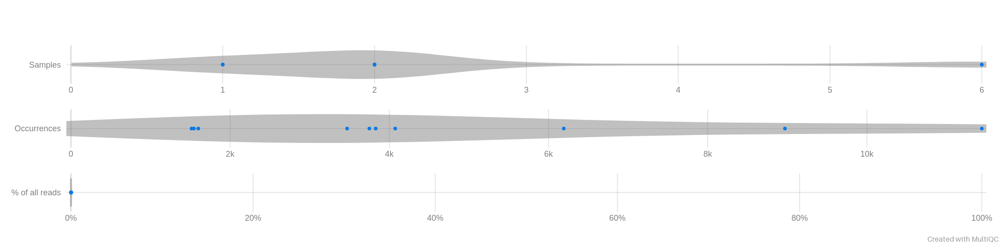
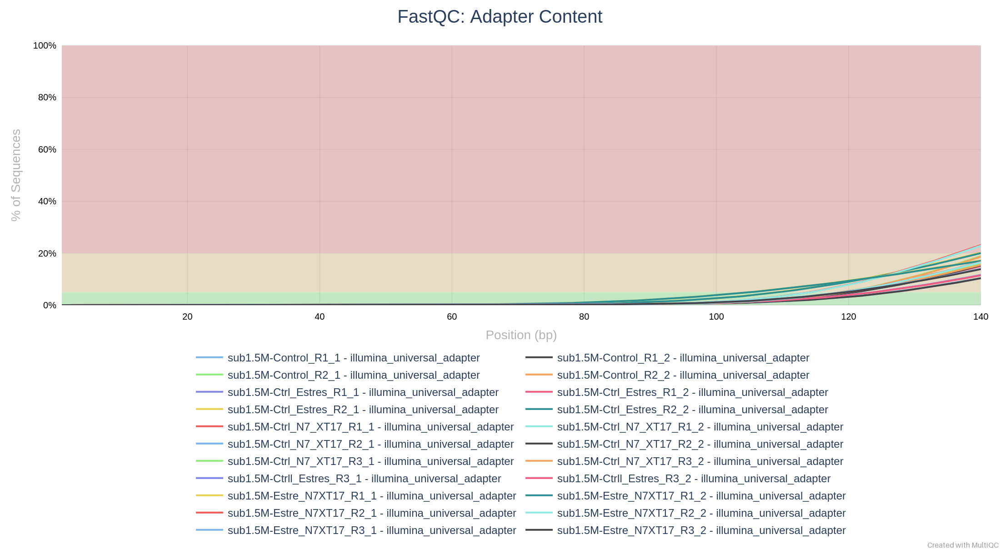
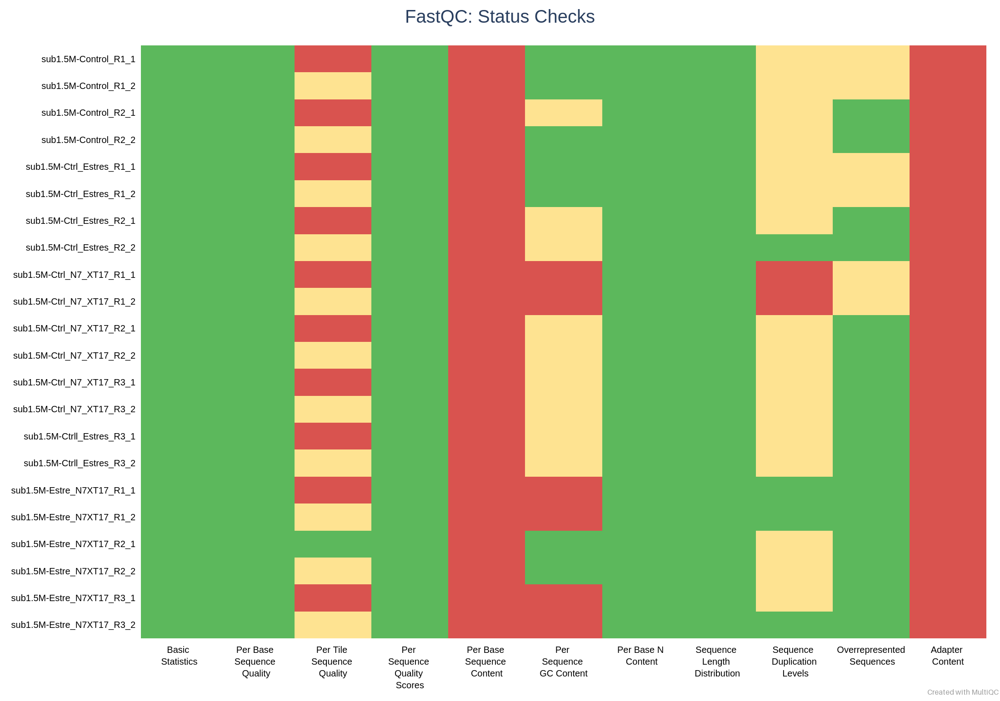
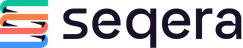

In [10]:
multiqc.run('./' + jobIdxPE +'/01-QC-Pre-Reports/',outdir = './' + jobIdxPE +'/01-QC-Pre-Reports/', plots_flat=True)
IPython.display.HTML('./' + jobIdxPE + '/01-QC-Pre-Reports/multiqc_report.html')

### 2. Trimming
#### 2.1. Trimmomatic



In [12]:
!trimmomatic -help

Usage: 
       PE [-version] [-threads <threads>] [-phred33|-phred64] [-trimlog <trimLogFile>] [-summary <statsSummaryFile>] [-quiet] [-validatePairs] [-basein <inputBase> | <inputFile1> <inputFile2>] [-baseout <outputBase> | <outputFile1P> <outputFile1U> <outputFile2P> <outputFile2U>] <trimmer1>...
   or: 
       SE [-version] [-threads <threads>] [-phred33|-phred64] [-trimlog <trimLogFile>] [-summary <statsSummaryFile>] [-quiet] <inputFile> <outputFile> <trimmer1>...
   or: 
       -version


Extracted from [Trimmomatic](https://github.com/usadellab/Trimmomatic):

> Trimmomatic performs a variety of useful trimming tasks for illumina paired-end and single ended data.The selection of trimming steps and their associated parameters are supplied on the command line.
>
>The current trimming steps are:
>
> - ILLUMINACLIP: Cut adapter and other illumina-specific sequences from the read.
> - SLIDINGWINDOW: Perform a sliding window trimming, cutting once the average quality within the window falls below a threshold.
> - LEADING: Cut bases off the start of a read, if below a threshold quality
> - TRAILING: Cut bases off the end of a read, if below a threshold quality
> - CROP: Cut the read to a specified length
> - HEADCROP: Cut the specified number of bases from the start of the read
> - MINLEN: Drop the read if it is below a specified length
> - TOPHRED33: Convert quality scores to Phred-33
> - TOPHRED64: Convert quality scores to Phred-64
>
>Example:
> - Remove adapters (ILLUMINACLIP:TruSeq3-SE.fa:2:30:10)
> - Remove leading low quality or N bases (below quality 3) (LEADING:3)
> - Remove trailing low quality or N bases (below quality 3) (TRAILING:3)
> - Scan the read with a 4-base wide sliding window, cutting when the average quality per base drops below 15 (SLIDINGWINDOW:4:15)
> - Drop reads below the 36 bases long (MINLEN:36)

##### Paired End Trimming

Using PE trimmomatic subcomand and the following parameters:
- -threads
- -summary
- -trimlog
- -phred33

```
trimmomatic PE filename_1.fastq.gz filename_2.fastq.gz \
 filename_paired_1.fastq.gz filename_unpaired_1.fastq.gz \
 filename_paired_2.fastq.gz filename_unpaired_2.fastq.gz \
 ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads \
 SLIDINGWINDOW:4:30 MINLEN:90
```


In [13]:
os.chdir(PEPath)
#!wget https://raw.githubusercontent.com/usadellab/Trimmomatic/main/adapters/TruSeq3-PE.fa
!ls -ltrh

total 4.8G
-rwxrwxrwx 1 ddelgadillo ddelgadillo   94 May 29 22:00 TruSeq3-PE.fa
-rwxrwxrwx 1 ddelgadillo ddelgadillo  478 Jul  4 09:45 Avena_codata.csv
-rwxrwxrwx 1 ddelgadillo ddelgadillo 117M Jul  4 09:50 sub1.5M-Estre_N7XT17_R3_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 111M Jul  4 09:51 sub1.5M-Estre_N7XT17_R3_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 115M Jul  4 09:51 sub1.5M-Estre_N7XT17_R2_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 108M Jul  4 09:52 sub1.5M-Estre_N7XT17_R2_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 118M Jul  4 09:52 sub1.5M-Estre_N7XT17_R1_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 110M Jul  4 09:53 sub1.5M-Estre_N7XT17_R1_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 115M Jul  4 09:54 sub1.5M-Ctrl_N7_XT17_R3_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 109M Jul  4 09:54 sub1.5M-Ctrl_N7_XT17_R3_1.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 114M Jul  4 09:55 sub1.5M-Ctrl_N7_XT17_R2_2.fastq.gz
-rwxrwxrwx 1 ddelgadillo ddelgadillo 1

In [14]:
display(metaPE.head())
!mkdir -p $jobIdxPE'/02-Trimming-Trimmomatic/summary'
!mkdir -p $jobIdxPE'/02-Trimming-Trimmomatic/unpaired'
!mkdir -p $jobIdxPE'/raw'

,file1,file2,type,shortName,meta1,meta2,meta3,replicate
0,sub1.5M-Ctrl_Estres_R1_1.fastq.gz,sub1.5M-Ctrl_Estres_R1_2.fastq.gz,paired,cont_estres_R1,Estres,Inoculado,A,1
1,sub1.5M-Ctrl_Estres_R2_1.fastq.gz,sub1.5M-Ctrl_Estres_R2_2.fastq.gz,paired,cont_estres_R2,Estres,Inoculado,A,2
2,sub1.5M-Ctrll_Estres_R3_1.fastq.gz,sub1.5M-Ctrll_Estres_R3_2.fastq.gz,paired,cont_estres_R3,Estres,Inoculado,A,3
3,sub1.5M-Control_R1_1.fastq.gz,sub1.5M-Control_R1_2.fastq.gz,paired,control_R1,Control,No_inoculado,B,1
4,sub1.5M-Control_R2_1.fastq.gz,sub1.5M-Control_R2_2.fastq.gz,paired,control_R2,Control,No_inoculado,B,2


In [15]:
#Open parameters
nthreads = '8'
adapterPath = 'TruSeq3-PE.fa'
minLen = '80'
slidingWindow = '4:30'

In [16]:
metaPE["trimmed1"] = None
metaPE["trimmed2"] = None

for i in metaPE.index:
    print(str(metaPE.file1[i]) + '  ' + str(metaPE.file2[i]))
    file1 = metaPE.file1[i].replace('.fastq','')
    file1 = file1.replace('.gz','')
    #print(file1)
    file2 = metaPE.file2[i].replace('.fastq','')
    file2 = file2.replace('.gz','')
    #print(file2)
    trimmedPairedFile1 = file1 + '_paired.fastq.gz'
    trimmedPairedFile2 = file2 + '_paired.fastq.gz'
    trimmedUnpairedFile1 = file1 + '_unpaired.fastq.gz'
    trimmedUnpairedFile2 = file2 + '_unpaired.fastq.gz'
    os.system('trimmomatic PE -threads '+ nthreads +' -summary ' + jobIdxPE + 
              '/02-Trimming-Trimmomatic/summary/' + metaPE.shortName[i] + '.log -phred33 ' + 
              metaPE.file1[i] + ' ' + metaPE.file2[i] + ' ' + 
              jobIdxPE + '/02-Trimming-Trimmomatic/' + trimmedPairedFile1 + ' ' + 
              jobIdxPE + '/02-Trimming-Trimmomatic/unpaired/' + trimmedUnpairedFile1 + ' ' + 
              jobIdxPE + '/02-Trimming-Trimmomatic/' + trimmedPairedFile2  + ' ' + 
              jobIdxPE + '/02-Trimming-Trimmomatic/unpaired/' + trimmedUnpairedFile2 + ' ' +
          'ILLUMINACLIP:' + adapterPath + ':2:30:10:2:keepBothReads SLIDINGWINDOW:' + slidingWindow + ' MINLEN:' + minLen)
    os.system('cp ' + metaPE.file1[i] + ' ' + jobIdxPE + '/raw/')
    os.system('cp ' + metaPE.file2[i] + ' ' + jobIdxPE + '/raw/')
    metaPE.loc[i,'trimmed1'] = trimmedPairedFile1
    metaPE.loc[i,'trimmed2'] = trimmedPairedFile2

sub1.5M-Ctrl_Estres_R1_1.fastq.gz  sub1.5M-Ctrl_Estres_R1_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/cont_estres_R1.log -phred33 sub1.5M-Ctrl_Estres_R1_1.fastq.gz sub1.5M-Ctrl_Estres_R1_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_Estres_R1_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_Estres_R1_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1500000 Both Surviving: 904128 (60.28%) Forward Only Surviving: 422075 (28.14%) Reverse Only Surviving: 5

sub1.5M-Ctrl_Estres_R2_1.fastq.gz  sub1.5M-Ctrl_Estres_R2_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/cont_estres_R2.log -phred33 sub1.5M-Ctrl_Estres_R2_1.fastq.gz sub1.5M-Ctrl_Estres_R2_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_Estres_R2_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_Estres_R2_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_Estres_R2_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1498035 Both Surviving: 842505 (56.24%) Forward Only Surviving: 480004 (32.04%) Reverse Only Surviving: 5

sub1.5M-Ctrll_Estres_R3_1.fastq.gz  sub1.5M-Ctrll_Estres_R3_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/cont_estres_R3.log -phred33 sub1.5M-Ctrll_Estres_R3_1.fastq.gz sub1.5M-Ctrll_Estres_R3_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrll_Estres_R3_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrll_Estres_R3_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrll_Estres_R3_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrll_Estres_R3_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1497933 Both Surviving: 945720 (63.14%) Forward Only Surviving: 371040 (24.77%) Reverse Only Surviv

sub1.5M-Control_R1_1.fastq.gz  sub1.5M-Control_R1_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/control_R1.log -phred33 sub1.5M-Control_R1_1.fastq.gz sub1.5M-Control_R1_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Control_R1_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Control_R1_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Control_R1_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Control_R1_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1497588 Both Surviving: 981181 (65.52%) Forward Only Surviving: 344964 (23.03%) Reverse Only Surviving: 62106 (4.15%) Dropped: 109337

sub1.5M-Control_R2_1.fastq.gz  sub1.5M-Control_R2_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/control_R2.log -phred33 sub1.5M-Control_R2_1.fastq.gz sub1.5M-Control_R2_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Control_R2_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Control_R2_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Control_R2_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Control_R2_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1500000 Both Surviving: 844982 (56.33%) Forward Only Surviving: 485004 (32.33%) Reverse Only Surviving: 54896 (3.66%) Dropped: 115118

sub1.5M-Ctrl_N7_XT17_R1_1.fastq.gz  sub1.5M-Ctrl_N7_XT17_R1_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/ctrl_N7_XT17_R1.log -phred33 sub1.5M-Ctrl_N7_XT17_R1_1.fastq.gz sub1.5M-Ctrl_N7_XT17_R1_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R1_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_N7_XT17_R1_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R1_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_N7_XT17_R1_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1499230 Both Surviving: 796870 (53.15%) Forward Only Surviving: 535377 (35.71%) Reverse Only Survi

sub1.5M-Ctrl_N7_XT17_R2_1.fastq.gz  sub1.5M-Ctrl_N7_XT17_R2_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/ctrl_N7_XT17_R2.log -phred33 sub1.5M-Ctrl_N7_XT17_R2_1.fastq.gz sub1.5M-Ctrl_N7_XT17_R2_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R2_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_N7_XT17_R2_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R2_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_N7_XT17_R2_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1498575 Both Surviving: 897448 (59.89%) Forward Only Surviving: 432033 (28.83%) Reverse Only Survi

sub1.5M-Ctrl_N7_XT17_R3_1.fastq.gz  sub1.5M-Ctrl_N7_XT17_R3_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/ctrl_N7_XT17_R3.log -phred33 sub1.5M-Ctrl_N7_XT17_R3_1.fastq.gz sub1.5M-Ctrl_N7_XT17_R3_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R3_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_N7_XT17_R3_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R3_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Ctrl_N7_XT17_R3_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1497949 Both Surviving: 1106261 (73.85%) Forward Only Surviving: 218157 (14.56%) Reverse Only Surv

sub1.5M-Estre_N7XT17_R1_1.fastq.gz  sub1.5M-Estre_N7XT17_R1_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/estres_N7_XT17_R1.log -phred33 sub1.5M-Estre_N7XT17_R1_1.fastq.gz sub1.5M-Estre_N7XT17_R1_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Estre_N7XT17_R1_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Estre_N7XT17_R1_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Estre_N7XT17_R1_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Estre_N7XT17_R1_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1498239 Both Surviving: 881208 (58.82%) Forward Only Surviving: 427952 (28.56%) Reverse Only Sur

sub1.5M-Estre_N7XT17_R2_1.fastq.gz  sub1.5M-Estre_N7XT17_R2_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/estres_N7_XT17_R2.log -phred33 sub1.5M-Estre_N7XT17_R2_1.fastq.gz sub1.5M-Estre_N7XT17_R2_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Estre_N7XT17_R2_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Estre_N7XT17_R2_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Estre_N7XT17_R2_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Estre_N7XT17_R2_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1498109 Both Surviving: 1127959 (75.29%) Forward Only Surviving: 210475 (14.05%) Reverse Only Su

sub1.5M-Estre_N7XT17_R3_1.fastq.gz  sub1.5M-Estre_N7XT17_R3_2.fastq.gz


TrimmomaticPE: Started with arguments:
 -threads 8 -summary AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/summary/estres_N7_XT17_R3.log -phred33 sub1.5M-Estre_N7XT17_R3_1.fastq.gz sub1.5M-Estre_N7XT17_R3_2.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Estre_N7XT17_R3_1_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Estre_N7XT17_R3_1_unpaired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Estre_N7XT17_R3_2_paired.fastq.gz AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/unpaired/sub1.5M-Estre_N7XT17_R3_2_unpaired.fastq.gz ILLUMINACLIP:TruSeq3-PE.fa:2:30:10:2:keepBothReads SLIDINGWINDOW:4:30 MINLEN:80
Using PrefixPair: 'TACACTCTTTCCCTACACGACGCTCTTCCGATCT' and 'GTGACTGGAGTTCAGACGTGTGCTCTTCCGATCT'
ILLUMINACLIP: Using 1 prefix pairs, 0 forward/reverse sequences, 0 forward only sequences, 0 reverse only sequences
Input Read Pairs: 1498163 Both Surviving: 924560 (61.71%) Forward Only Surviving: 397217 (26.51%) Reverse Only Sur

### Quality control Pos trimming


#### Paired End Pos QC


In [17]:
os.chdir(PEPath)
!tree -d

.
└── AvenaSub1.5M-RNASeq-PE
    ├── 01-QC-Pre-Reports
    │   └── multiqc_data
    ├── 02-Trimming-Trimmomatic
    │   ├── summary
    │   └── unpaired
    ├── 03-QC-Pos-Reports
    │   └── multiqc_data
    ├── 04-RefGenome-Alignments-Kallisto
    │   └── log
    └── raw

11 directories


In [18]:
!mkdir -p $jobIdxPE'/03-QC-Pos-Reports/'
!fastqc -o $jobIdxPE'/03-QC-Pos-Reports/' $jobIdxPE/02-Trimming-Trimmomatic/*.fastq.gz -t 8 --nogroup

application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
application/gzip
Started analysis of sub1.5M-Control_R1_1_paired.fastq.gz
Started analysis of sub1.5M-Control_R1_2_paired.fastq.gz
Started analysis of sub1.5M-Control_R2_1_paired.fastq.gz
Started analysis of sub1.5M-Control_R2_2_paired.fastq.gz
Started analysis of sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz
Started analysis of sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz
Approx 5% complete for sub1.5M-Control_R1_1_paired.fastq.gz
Started analysis of sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz
Approx 5% complete for sub1.5M-Control_R1_2_paired.fastq.gz
Approx 5% complete for sub1.5M-Control_R2_1_paired.fastq.gz
Started analysis of sub1.5M-Ctrl_Es

Approx 80% complete for sub1.5M-Control_R2_2_paired.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_Estres_R2_2_paired.fastq.gz
Approx 75% complete for sub1.5M-Control_R1_1_paired.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz
Approx 85% complete for sub1.5M-Control_R2_1_paired.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz
Approx 75% complete for sub1.5M-Control_R1_2_paired.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz
Approx 85% complete for sub1.5M-Control_R2_2_paired.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_Estres_R2_2_paired.fastq.gz
Approx 90% complete for sub1.5M-Control_R2_1_paired.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz
Approx 80% complete for sub1.5M-Control_R1_1_paired.fastq.gz
Approx 85% complete for sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz
Approx 85% complete for sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz
Approx 90% complete for sub1.5M-Control_R2_2_paired.f

Approx 40% complete for sub1.5M-Ctrll_Estres_R3_2_paired.fastq.gz
Approx 55% complete for sub1.5M-Ctrl_N7_XT17_R2_1_paired.fastq.gz
Approx 70% complete for sub1.5M-Ctrl_N7_XT17_R1_1_paired.fastq.gz
Approx 45% complete for sub1.5M-Ctrll_Estres_R3_1_paired.fastq.gz
Approx 40% complete for sub1.5M-Ctrl_N7_XT17_R3_2_paired.fastq.gz
Approx 70% complete for sub1.5M-Ctrl_N7_XT17_R1_2_paired.fastq.gz
Approx 55% complete for sub1.5M-Ctrl_N7_XT17_R2_2_paired.fastq.gz
Approx 45% complete for sub1.5M-Ctrl_N7_XT17_R3_1_paired.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_N7_XT17_R1_1_paired.fastq.gz
Approx 60% complete for sub1.5M-Ctrl_N7_XT17_R2_1_paired.fastq.gz
Approx 45% complete for sub1.5M-Ctrll_Estres_R3_2_paired.fastq.gz
Approx 50% complete for sub1.5M-Ctrll_Estres_R3_1_paired.fastq.gz
Approx 75% complete for sub1.5M-Ctrl_N7_XT17_R1_2_paired.fastq.gz
Approx 45% complete for sub1.5M-Ctrl_N7_XT17_R3_2_paired.fastq.gz
Approx 80% complete for sub1.5M-Ctrl_N7_XT17_R1_1_paired.fastq.gz
Approx 60%

Approx 20% complete for sub1.5M-Estre_N7XT17_R3_1_paired.fastq.gz
Approx 25% complete for sub1.5M-Estre_N7XT17_R2_2_paired.fastq.gz
Approx 15% complete for sub1.5M-Estre_N7XT17_R3_2_paired.fastq.gz
Approx 30% complete for sub1.5M-Estre_N7XT17_R2_1_paired.fastq.gz
Approx 60% complete for sub1.5M-Estre_N7XT17_R1_1_paired.fastq.gz
Approx 55% complete for sub1.5M-Estre_N7XT17_R1_2_paired.fastq.gz
Approx 25% complete for sub1.5M-Estre_N7XT17_R3_1_paired.fastq.gz
Approx 20% complete for sub1.5M-Estre_N7XT17_R3_2_paired.fastq.gz
Approx 30% complete for sub1.5M-Estre_N7XT17_R2_2_paired.fastq.gz
Approx 35% complete for sub1.5M-Estre_N7XT17_R2_1_paired.fastq.gz
Approx 65% complete for sub1.5M-Estre_N7XT17_R1_1_paired.fastq.gz
Approx 60% complete for sub1.5M-Estre_N7XT17_R1_2_paired.fastq.gz
Approx 30% complete for sub1.5M-Estre_N7XT17_R3_1_paired.fastq.gz
Approx 25% complete for sub1.5M-Estre_N7XT17_R3_2_paired.fastq.gz
Approx 35% complete for sub1.5M-Estre_N7XT17_R2_2_paired.fastq.gz
Approx 70%

/// ]8;id=931223;https://multiqc.info\MultiQC]8;;\ 🔍 | v1.21

|           multiqc | MultiQC Version v1.23 now available!
|           multiqc | Search path : /mnt/d/PE/Avena/AvenaSub1.5M-RNASeq-PE/03-QC-Pos-Reports


Output()

|            fastqc | Found 22 reports
|           multiqc | Report      : AvenaSub1.5M-RNASeq-PE/03-QC-Pos-Reports/multiqc_report.html   (overwritten)
|           multiqc | Data        : AvenaSub1.5M-RNASeq-PE/03-QC-Pos-Reports/multiqc_data   (overwritten)
|           multiqc | MultiQC complete



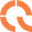
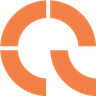
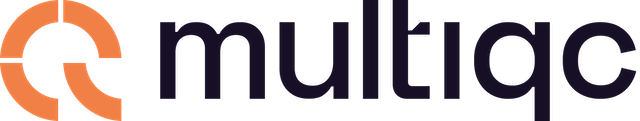
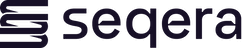
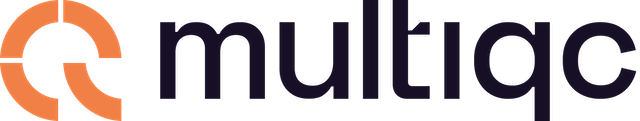
...
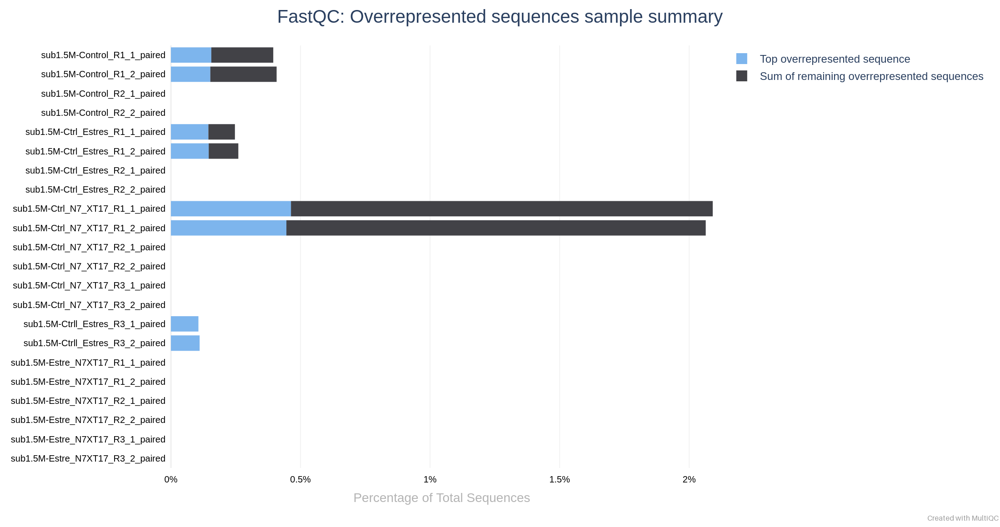
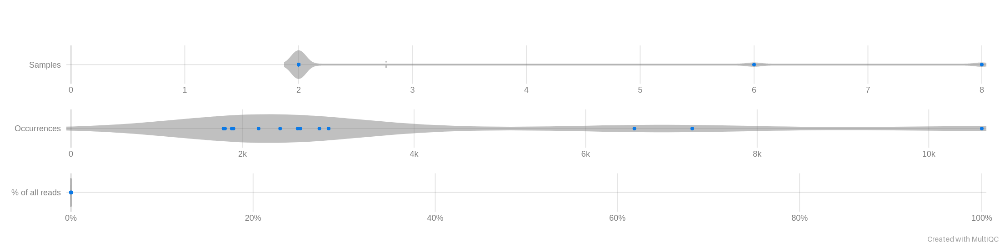
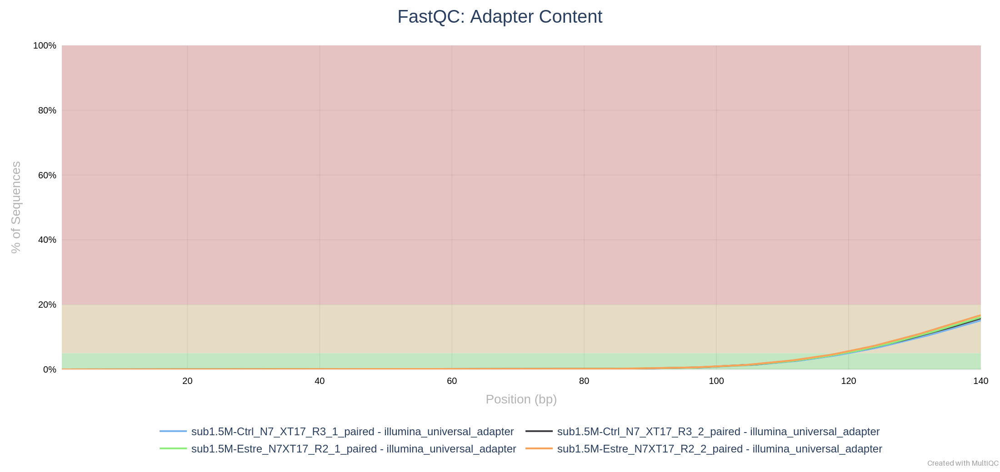
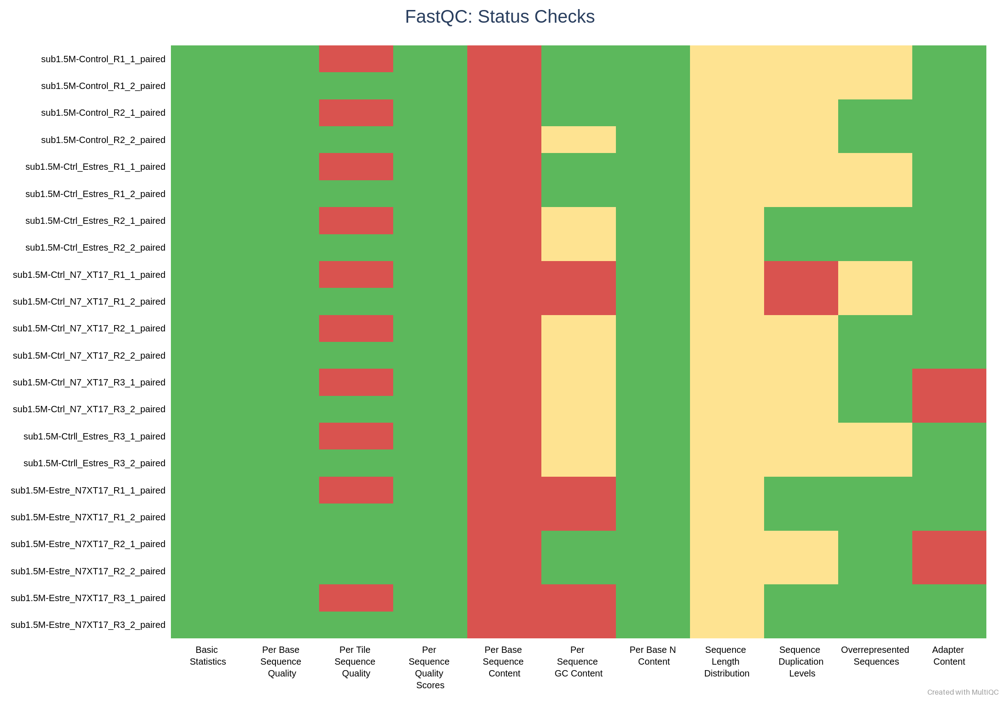
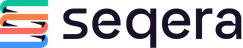

In [11]:
multiqc.run('./' + jobIdxPE +'/03-QC-Pos-Reports/',outdir = './' + jobIdxPE +'/03-QC-Pos-Reports/', plots_flat=True)
IPython.display.HTML('./' + jobIdxPE + '/03-QC-Pos-Reports/multiqc_report.html')

## Read alignment

### Kallisto pseudo alignment

In [20]:
!kallisto

kallisto 0.48.0

Usage: kallisto <CMD> [arguments] ..

Where <CMD> can be one of:

    index         Builds a kallisto index 
    quant         Runs the quantification algorithm 
    quant-tcc     Runs quantification on transcript-compatibility counts
    bus           Generate BUS files for single-cell data 
    merge         Merges several batch runs 
    h5dump        Converts HDF5-formatted results to plaintext
    inspect       Inspects and gives information about an index
    version       Prints version information
    cite          Prints citation information

Running kallisto <CMD> without arguments prints usage information for <CMD>



In [21]:
!kallisto index


kallisto 0.48.0
Builds a kallisto index

Usage: kallisto index [arguments] FASTA-files

Required argument:
-i, --index=STRING          Filename for the kallisto index to be constructed 

Optional argument:
-k, --kmer-size=INT         k-mer (odd) length (default: 31, max value: 31)
    --make-unique           Replace repeated target names with unique names



In [22]:
!kallisto quant

kallisto 0.48.0
Computes equivalence classes for reads and quantifies abundances

Usage: kallisto quant [arguments] FASTQ-files

Required arguments:
-i, --index=STRING            Filename for the kallisto index to be used for
                              quantification
-o, --output-dir=STRING       Directory to write output to

Optional arguments:
    --bias                    Perform sequence based bias correction
-b, --bootstrap-samples=INT   Number of bootstrap samples (default: 0)
    --seed=INT                Seed for the bootstrap sampling (default: 42)
    --plaintext               Output plaintext instead of HDF5
    --fusion                  Search for fusions for Pizzly
    --single                  Quantify single-end reads
    --single-overhang         Include reads where unobserved rest of fragment is
                              predicted to lie outside a transcript
    --fr-stranded             Strand specific reads, first read forward
    --rf-stranded             Str

#### Paired end SA

In [23]:
os.chdir(PEPath)
!tree -d

.
└── AvenaSub1.5M-RNASeq-PE
    ├── 01-QC-Pre-Reports
    │   └── multiqc_data
    ├── 02-Trimming-Trimmomatic
    │   ├── summary
    │   └── unpaired
    ├── 03-QC-Pos-Reports
    │   └── multiqc_data
    ├── 04-RefGenome-Alignments-Kallisto
    │   └── log
    └── raw

11 directories


In [24]:
!mkdir -p $jobIdxPE'/04-RefGenome-Alignments-Kallisto/log'

In [14]:
display(metaPE.head())

,file1,file2,type,shortName,meta1,meta2,meta3,replicate,trimmed1,trimmed2
0,sub1.5M-Ctrl_Estres_R1_1.fastq.gz,sub1.5M-Ctrl_Estres_R1_2.fastq.gz,paired,cont_estres_R1,Estres,Inoculado,A,1,sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz
1,sub1.5M-Ctrl_Estres_R2_1.fastq.gz,sub1.5M-Ctrl_Estres_R2_2.fastq.gz,paired,cont_estres_R2,Estres,Inoculado,A,2,sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R2_2_paired.fastq.gz
2,sub1.5M-Ctrll_Estres_R3_1.fastq.gz,sub1.5M-Ctrll_Estres_R3_2.fastq.gz,paired,cont_estres_R3,Estres,Inoculado,A,3,sub1.5M-Ctrll_Estres_R3_1_paired.fastq.gz,sub1.5M-Ctrll_Estres_R3_2_paired.fastq.gz
3,sub1.5M-Control_R1_1.fastq.gz,sub1.5M-Control_R1_2.fastq.gz,paired,control_R1,Control,No_inoculado,B,1,sub1.5M-Control_R1_1_paired.fastq.gz,sub1.5M-Control_R1_2_paired.fastq.gz
4,sub1.5M-Control_R2_1.fastq.gz,sub1.5M-Control_R2_2.fastq.gz,paired,control_R2,Control,No_inoculado,B,2,sub1.5M-Control_R2_1_paired.fastq.gz,sub1.5M-Control_R2_2_paired.fastq.gz


#### Reference genomeAnnotation PE

In [13]:
#refGenomeGTFAnnotationPath = "/mnt/d/PE/Avena/Pepsico-OT3098-A.gtf"
#refGenomeGFFAnnotationPath = "/mnt/d/PE/Avena/Pepsico-OT3098-A.gff3.gz"


refGenomeGTFAnnotationPath = "/mnt/d/PE/Avena/Asativa_sang.v1-A.gtf"
refGenomeGFFAnnotationPath = "/mnt/d/PE/Avena/Asativa_sang.v1-A.gff3"

In [15]:
print(refGenomeGTFAnnotationPath)


if is_gzipped_content(refGenomeGTFAnnotationPath):
    decompress_gzipped(refGenomeGTFAnnotationPath, jobIdxSE + '/RefGenomeAnn.gtf')
    refGenomeGTFAnnotationPath = jobIdxSE + '/RefGenomeAnn.gtf'
    
refGenomeGTFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gtf'

/mnt/d/PE/Avena/Asativa_sang.v1-A.gtf


In [16]:
print(refGenomeGFFAnnotationPath)


if is_gzipped_content(refGenomeGFFAnnotationPath):
    decompress_gzipped(refGenomeGFFAnnotationPath, jobIdxPE + '/RefGenomeAnn.gff')
    refGenomeGFFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gff'
    
#refGenomeGFFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gff'
print(refGenomeGFFAnnotationPath)

/mnt/d/PE/Avena/Asativa_sang.v1-A.gff3
/mnt/d/PE/Avena/Asativa_sang.v1-A.gff3


#### Reference genome Index PE-SA

In [17]:
refGenomePath = "/mnt/d/PE/Avena/Pepsico-OT3098-A.fasta.gz"


In [ ]:
#%%timeit
import subprocess
process = subprocess.Popen(['kallisto', 'index', '-i', jobIdxPE + '/RefGenome.index', refGenomePath], stdout = subprocess.PIPE,
                          stderr=subprocess.PIPE, text=True)
stdout, stderr = process.communicate()
# Print the output of the command
print(stderr)
#os.system('kallisto index -i ' + jobIdxSE + '/RefGenome.index ' + refGenomePath)

In [ ]:
print(stdout)

In [ ]:
#Open parameters

fLen = '250' #-l
nthreads = '8' #-t
stDev = '30' # -s


In [ ]:
for i in metaPE.index:
    #print(metaSE.trimmed[i])
    cmdList = ['kallisto', 'quant' ,'-i', jobIdxPE + '/RefGenome.index', 
                '-o', jobIdxPE + '/04-RefGenome-Alignments-Kallisto/' + metaPE.shortName[i], 
                '-t',  nthreads, '-l', fLen, '-s', stDev, 
                jobIdxPE + '/02-Trimming-Trimmomatic/' + metaPE.trimmed1[i],
                jobIdxPE + '/02-Trimming-Trimmomatic/' + metaPE.trimmed2[i],]

    print(cmdList)
    #print('kallisto quant -i ' + jobIdxSE + '/RefGenome.index -o ' + jobIdxSE + 
    #          '/04-RefGenome-Alignments-Kallisto/' + metaSE.shortName[i] + ' -t ' + nthreads + ' --single -l ' + fLen + 
    #          ' -s ' + stDev + ' ' + jobIdxSE + '/02-Trimming-Trimmomatic/' + metaSE.trimmed[i] + ' > ' + jobIdxSE + '/04-RefGenome-Alignments-Kallisto/log/' + metaSE.shortName[i] + '.log')

    process = subprocess.Popen(cmdList, stdout = subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    stdout, stderr = process.communicate()
    print(stderr)
    print(stdout)

### Stringtie - Hisat2 Read alignment

In [30]:
!hisat2-build --help

HISAT2 version 2.2.1 by Daehwan Kim (infphilo@gmail.com, http://www.ccb.jhu.edu/people/infphilo)
Usage: hisat2-build [options]* <reference_in> <ht2_index_base>
    reference_in            comma-separated list of files with ref sequences
    hisat2_index_base       write ht2 data to files with this dir/basename
Options:
    -c                      reference sequences given on cmd line (as
                            <reference_in>)
    --large-index           force generated index to be 'large', even if ref
                            has fewer than 4 billion nucleotides
    -a/--noauto             disable automatic -p/--bmax/--dcv memory-fitting
    -p <int>                number of threads
    --bmax <int>            max bucket sz for blockwise suffix-array builder
    --bmaxdivn <int>        max bucket sz as divisor of ref len (default: 4)
    --dcv <int>             diff-cover period for blockwise (default: 1024)
    --nodc                  disable diff-cover (algorithm becomes quad

In [31]:
!hisat2 --help

HISAT2 version 2.2.1 by Daehwan Kim (infphilo@gmail.com, www.ccb.jhu.edu/people/infphilo)
Usage: 
  hisat2 [options]* -x <ht2-idx> {-1 <m1> -2 <m2> | -U <r>} [-S <sam>]

  <ht2-idx>  Index filename prefix (minus trailing .X.ht2).
  <m1>       Files with #1 mates, paired with files in <m2>.
             Could be gzip'ed (extension: .gz) or bzip2'ed (extension: .bz2).
  <m2>       Files with #2 mates, paired with files in <m1>.
             Could be gzip'ed (extension: .gz) or bzip2'ed (extension: .bz2).
  <r>        Files with unpaired reads.
             Could be gzip'ed (extension: .gz) or bzip2'ed (extension: .bz2).
  <sam>      File for SAM output (default: stdout)

  <m1>, <m2>, <r> can be comma-separated lists (no whitespace) and can be
  specified many times.  E.g. '-U file1.fq,file2.fq -U file3.fq'.

Options (defaults in parentheses):

 Input:
  -q                 query input files are FASTQ .fq/.fastq (default)
  --qseq             query input files are in Illumina's qseq forma

#### Paired end RA

In [32]:
os.chdir(PEPath)
!tree -d

.
└── AvenaSub1.5M-RNASeq-PE
    ├── 01-QC-Pre-Reports
    │   └── multiqc_data
    ├── 02-Trimming-Trimmomatic
    │   ├── summary
    │   └── unpaired
    ├── 03-QC-Pos-Reports
    │   └── multiqc_data
    ├── 04-RefGenome-Alignments-Kallisto
    │   └── log
    └── raw

11 directories


In [61]:
!mkdir -p $jobIdxPE'/04-RefGenome-Alignments-Hisat2/index'

In [62]:
os.getcwd()

'/mnt/d/PE/Avena'

In [18]:
display(metaPE.head())

,file1,file2,type,shortName,meta1,meta2,meta3,replicate,trimmed1,trimmed2
0,sub1.5M-Ctrl_Estres_R1_1.fastq.gz,sub1.5M-Ctrl_Estres_R1_2.fastq.gz,paired,cont_estres_R1,Estres,Inoculado,A,1,sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz
1,sub1.5M-Ctrl_Estres_R2_1.fastq.gz,sub1.5M-Ctrl_Estres_R2_2.fastq.gz,paired,cont_estres_R2,Estres,Inoculado,A,2,sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R2_2_paired.fastq.gz
2,sub1.5M-Ctrll_Estres_R3_1.fastq.gz,sub1.5M-Ctrll_Estres_R3_2.fastq.gz,paired,cont_estres_R3,Estres,Inoculado,A,3,sub1.5M-Ctrll_Estres_R3_1_paired.fastq.gz,sub1.5M-Ctrll_Estres_R3_2_paired.fastq.gz
3,sub1.5M-Control_R1_1.fastq.gz,sub1.5M-Control_R1_2.fastq.gz,paired,control_R1,Control,No_inoculado,B,1,sub1.5M-Control_R1_1_paired.fastq.gz,sub1.5M-Control_R1_2_paired.fastq.gz
4,sub1.5M-Control_R2_1.fastq.gz,sub1.5M-Control_R2_2.fastq.gz,paired,control_R2,Control,No_inoculado,B,2,sub1.5M-Control_R2_1_paired.fastq.gz,sub1.5M-Control_R2_2_paired.fastq.gz


In [64]:
metaPE.to_csv(jobIdxPE + "/metadata.csv", sep = ",", header = True, index = False)

#### Reference genome Index PE-RA

In [65]:
refGenomePath = "/mnt/d/PE/Avena/Pepsico-OT3098-A.fasta.gz"


In [66]:
print(refGenomePath)
if is_gzipped_content(refGenomePath):
    os.system('gzip -d ' + refGenomePath + ' -c > ' + jobIdxPE + '/RefGenome.fa')
    refGenomePath = jobIdxPE + '/RefGenome.fa'

/mnt/d/PE/Avena/Pepsico-OT3098-A.fasta.gz


In [67]:
#%%timeit
import subprocess
process = subprocess.Popen(['hisat2-build', refGenomePath, jobIdxPE + '/04-RefGenome-Alignments-Hisat2/index/RefGenomeHisat2Index'], 
                           stdout = subprocess.PIPE, stderr=subprocess.PIPE, text=True)
stdout, stderr = process.communicate()
# Print the output of the command
print(stderr)

Settings:
  Output files: "AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/index/RefGenomeHisat2Index.*.ht2"
  Line rate: 6 (line is 64 bytes)
  Lines per side: 1 (side is 64 bytes)
  Offset rate: 4 (one in 16)
  FTable chars: 10
  Strings: unpacked
  Local offset rate: 3 (one in 8)
  Local fTable chars: 6
  Local sequence length: 57344
  Local sequence overlap between two consecutive indexes: 1024
  Endianness: little
  Actual local endianness: little
  Sanity checking: disabled
  Assertions: disabled
  Random seed: 0
  Sizeofs: void*:8, int:4, long:8, size_t:8
Input files DNA, FASTA:
  AvenaSub1.5M-RNASeq-PE/RefGenome.fa
Reading reference sizes
  Time reading reference sizes: 00:00:46
Calculating joined length
Writing header
Reserving space for joined string
Joining reference sequences
  Time to join reference sequences: 00:00:42
  Time to read SNPs and splice sites: 00:00:00
Using parameters --bmax 619056366 --dcv 1024
  Doing ahead-of-time memory usage test
  Passed!  Constru

In [68]:
print(stdout)

Building DifferenceCoverSample
  Building sPrime
  Building sPrimeOrder
  V-Sorting samples
  V-Sorting samples time: 00:02:26
  Allocating rank array
  Ranking v-sort output
  Ranking v-sort output time: 00:00:27
  Invoking Larsson-Sadakane on ranks
  Invoking Larsson-Sadakane on ranks time: 00:00:41
  Sanity-checking and returning
Building samples
Reserving space for 12 sample suffixes
Generating random suffixes
QSorting 12 sample offsets, eliminating duplicates
QSorting sample offsets, eliminating duplicates time: 00:00:00
Multikey QSorting 12 samples
  (Using difference cover)
  Multikey QSorting samples time: 00:00:00
Calculating bucket sizes
Splitting and merging
  Splitting and merging time: 00:00:00
Split 2, merged 7; iterating...
Splitting and merging
  Splitting and merging time: 00:00:00
Split 1, merged 2; iterating...
Splitting and merging
  Splitting and merging time: 00:00:00
Avg bucket size: 4.71662e+08 (target: 619056365)
Getting block 1 of 7
  Reserving size (619056366

In [69]:
refGenomeGTFAnnotationPath = "/mnt/d/PE/Avena/Pepsico-OT3098-A.gtf"
refGenomeGFFAnnotationPath = "/mnt/d/PE/Avena/Pepsico-OT3098-A.gff3.gz"


#refGenomeGTFAnnotationPath = "/mnt/d/PE/Avena/Asativa_sang.v1-A.gtf"
#refGenomeGFFAnnotationPath = "/mnt/d/PE/Avena/Asativa_sang.v1-A.gff3"

In [70]:
#Open parameters

nthreads = '8' #-t


In [71]:
for i in metaPE.index:
    #print(metaSE.trimmed[i])
    cmdList = ['hisat2', '-p', nthreads, '--dta', '-x', jobIdxPE + '/04-RefGenome-Alignments-Hisat2/index/RefGenomeHisat2Index', 
               '-1', jobIdxPE + '/02-Trimming-Trimmomatic/' + metaPE.trimmed1[i],
               '-2', jobIdxPE + '/02-Trimming-Trimmomatic/' + metaPE.trimmed2[i],
               '-S', jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.sam']

    print(cmdList)
    #print('kallisto quant -i ' + jobIdxSE + '/RefGenome.index -o ' + jobIdxSE + 
    #          '/04-RefGenome-Alignments-Kallisto/' + metaSE.shortName[i] + ' -t ' + nthreads + ' --single -l ' + fLen + 
    #          ' -s ' + stDev + ' ' + jobIdxSE + '/02-Trimming-Trimmomatic/' + metaSE.trimmed[i] + ' > ' + jobIdxSE + '/04-RefGenome-Alignments-Kallisto/log/' + metaSE.shortName[i] + '.log')

    process = subprocess.Popen(cmdList, stdout = subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    stdout, stderr = process.communicate()
    print(stderr)
    print(stdout)
    
    cmdList = ['samtools', 'sort', '-@' , nthreads, '-o', 
               jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.bam',
               jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.sam']

    print(cmdList)
    #print('kallisto quant -i ' + jobIdxSE + '/RefGenome.index -o ' + jobIdxSE + 
    #          '/04-RefGenome-Alignments-Kallisto/' + metaSE.shortName[i] + ' -t ' + nthreads + ' --single -l ' + fLen + 
    #          ' -s ' + stDev + ' ' + jobIdxSE + '/02-Trimming-Trimmomatic/' + metaSE.trimmed[i] + ' > ' + jobIdxSE + '/04-RefGenome-Alignments-Kallisto/log/' + metaSE.shortName[i] + '.log')

    process = subprocess.Popen(cmdList, stdout = subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    stdout, stderr = process.communicate()
    print(stderr)
    print(stdout)
    
    os.system('rm -rf ' + jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.sam' )

['hisat2', '-p', '8', '--dta', '-x', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/index/RefGenomeHisat2Index', '-1', 'AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz', '-2', 'AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz', '-S', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R1.sam']
904128 reads; of these:
  904128 (100.00%) were paired; of these:
    304653 (33.70%) aligned concordantly 0 times
    488462 (54.03%) aligned concordantly exactly 1 time
    111013 (12.28%) aligned concordantly >1 times
    ----
    304653 pairs aligned concordantly 0 times; of these:
      6748 (2.21%) aligned discordantly 1 time
    ----
    297905 pairs aligned 0 times concordantly or discordantly; of these:
      595810 mates make up the pairs; of these:
        470453 (78.96%) aligned 0 times
        113132 (18.99%) aligned exactly 1 time
        12225 (2.05%) aligned >1 times
73.98% overal

[bam_sort_core] merging from 0 files and 8 in-memory blocks...


['hisat2', '-p', '8', '--dta', '-x', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/index/RefGenomeHisat2Index', '-1', 'AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R3_1_paired.fastq.gz', '-2', 'AvenaSub1.5M-RNASeq-PE/02-Trimming-Trimmomatic/sub1.5M-Ctrl_N7_XT17_R3_2_paired.fastq.gz', '-S', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/ctrl_N7_XT17_R3.sam']
1106261 reads; of these:
  1106261 (100.00%) were paired; of these:
    1104507 (99.84%) aligned concordantly 0 times
    1341 (0.12%) aligned concordantly exactly 1 time
    413 (0.04%) aligned concordantly >1 times
    ----
    1104507 pairs aligned concordantly 0 times; of these:
      228850 (20.72%) aligned discordantly 1 time
    ----
    875657 pairs aligned 0 times concordantly or discordantly; of these:
      1751314 mates make up the pairs; of these:
        928694 (53.03%) aligned 0 times
        735909 (42.02%) aligne

#### Reference genomeAnnotation PE-RA

In [19]:
print(refGenomeGFFAnnotationPath)


if is_gzipped_content(refGenomeGFFAnnotationPath):
    decompress_gzipped(refGenomeGFFAnnotationPath, jobIdxPE + '/RefGenomeAnn.gff')
    refGenomeGFFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gff'
    
#refGenomeGFFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gff'
print(refGenomeGFFAnnotationPath)

/mnt/d/PE/Avena/Asativa_sang.v1-A.gff3
/mnt/d/PE/Avena/Asativa_sang.v1-A.gff3


#### Indexing for IGV visualization PE-RA

In [74]:
!samtools faidx -h

Usage: samtools faidx <file.fa|file.fa.gz> [<reg> [...]]
Option: 
 -o, --output FILE        Write FASTA to file.
 -n, --length INT         Length of FASTA sequence line. [60]
 -c, --continue           Continue after trying to retrieve missing region.
 -r, --region-file FILE   File of regions.  Format is chr:from-to. One per line.
 -i, --reverse-complement Reverse complement sequences.
     --mark-strand TYPE   Add strand indicator to sequence name
                          TYPE = rc   for /rc on negative strand (default)
                                 no   for no strand indicator
                                 sign for (+) / (-)
                                 custom,<pos>,<neg> for custom indicator
     --fai-idx      FILE  name of the index file (default file.fa.fai).
     --gzi-idx      FILE  name of compressed file index (default file.fa.gz.gzi).
 -f, --fastq              File and index in FASTQ format.
 -h, --help               This message.


In [75]:
os.system("samtools faidx -o " + refGenomePath + ".fai " + refGenomePath)
#!samtools faidx $IDX

0

In [76]:
for i in metaPE.index:
    cmdList = ['samtools', 'index', '-@' , nthreads, '-o', 
               jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.bam.bai',
               jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.bam']
    process = subprocess.Popen(cmdList, stdout = subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    stdout, stderr = process.communicate()
    #print(stderr)
    #print(stdout)
    os.system("bedtools genomecov -ibam " + jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + 
              ".bam -split -bg > " + jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + ".bg")
    os.system("bedGraphToBigWig " + jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + ".bg " + 
              refGenomePath + ".fai " + jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + ".bw")

In [20]:
reference = {
            "id": "Reference Genome",
            "name": "Reference Genome",
            "fastaPath": refGenomePath,
            "indexPath": refGenomePath + ".fai"
            }
tracks = [{
    "name": "Annotation",
    "path": refGenomeGFFAnnotationPath,
    "displayMode": "SQUISHED",
    "indexed": False,
    "type": "annotation",
    "format": "gff3"
}]
for i in metaPE.index:
    tempTrack = {
        "type": "wig",
        "name": metaPE.shortName[i],
        "path": jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + ".bw",
        "format": "bigWig",
        "filename": metaPE.shortName[i] + ".bw"
    }
    tracks.append(tempTrack)
print(reference)
print(tracks)

{'id': 'Reference Genome', 'name': 'Reference Genome', 'fastaPath': '/mnt/d/PE/Avena/Pepsico-OT3098-A.fasta.gz', 'indexPath': '/mnt/d/PE/Avena/Pepsico-OT3098-A.fasta.gz.fai'}
[{'name': 'Annotation', 'path': '/mnt/d/PE/Avena/Asativa_sang.v1-A.gff3', 'displayMode': 'SQUISHED', 'indexed': False, 'type': 'annotation', 'format': 'gff3'}, {'type': 'wig', 'name': 'cont_estres_R1', 'path': 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R1.bw', 'format': 'bigWig', 'filename': 'cont_estres_R1.bw'}, {'type': 'wig', 'name': 'cont_estres_R2', 'path': 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R2.bw', 'format': 'bigWig', 'filename': 'cont_estres_R2.bw'}, {'type': 'wig', 'name': 'cont_estres_R3', 'path': 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R3.bw', 'format': 'bigWig', 'filename': 'cont_estres_R3.bw'}, {'type': 'wig', 'name': 'control_R1', 'path': 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/control_R1.bw', 'format': '

In [21]:
import igv_notebook

igv_notebook.init()

b = igv_notebook.Browser(
    {
        "reference": reference,
        "tracks": tracks
        
})


b.zoom_in()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Assemble and quantify expressed genes and transcripts

In [79]:
!stringtie -h

StringTie v2.2.3 usage:

stringtie <in.bam ..> [-G <guide_gff>] [-l <prefix>] [-o <out.gtf>] [-p <cpus>]
 [-v] [-a <min_anchor_len>] [-m <min_len>] [-j <min_anchor_cov>] [-f <min_iso>]
 [-c <min_bundle_cov>] [-g <bdist>] [-u] [-L] [-e] [--viral] [-E <err_margin>]
 [--ptf <f_tab>] [-x <seqid,..>] [-A <gene_abund.out>] [-h] {-B|-b <dir_path>}
 [--mix] [--conservative] [--rf] [--fr]
Assemble RNA-Seq alignments into potential transcripts.
Options:
 --version : print just the version at stdout and exit
 --conservative : conservative transcript assembly, same as -t -c 1.5 -f 0.05
 --mix : both short and long read data alignments are provided
        (long read alignments must be the 2nd BAM/CRAM input file)
 --rf : assume stranded library fr-firststrand
 --fr : assume stranded library fr-secondstrand
 -G reference annotation to use for guiding the assembly process (GTF/GFF)
 --ptf : load point-features from a given 4 column feature file <f_tab>
 -o output path/file name for the assembled tra

#### Paired end A-Q-DEGs

In [80]:
os.chdir(PEPath)
!tree -d

.
└── AvenaSub1.5M-RNASeq-PE
    ├── 01-QC-Pre-Reports
    │   └── multiqc_data
    ├── 02-Trimming-Trimmomatic
    │   ├── summary
    │   └── unpaired
    ├── 03-QC-Pos-Reports
    │   └── multiqc_data
    ├── 04-RefGenome-Alignments-Hisat2
    │   └── index
    ├── 04-RefGenome-Alignments-Kallisto
    │   └── log
    └── raw

13 directories


In [81]:
!mkdir -p $jobIdxPE'/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/'

In [82]:
display(metaPE.head())

,file1,file2,type,shortName,meta1,meta2,meta3,replicate,trimmed1,trimmed2
0,sub1.5M-Ctrl_Estres_R1_1.fastq.gz,sub1.5M-Ctrl_Estres_R1_2.fastq.gz,paired,cont_estres_R1,Estres,Inoculado,A,1,sub1.5M-Ctrl_Estres_R1_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R1_2_paired.fastq.gz
1,sub1.5M-Ctrl_Estres_R2_1.fastq.gz,sub1.5M-Ctrl_Estres_R2_2.fastq.gz,paired,cont_estres_R2,Estres,Inoculado,A,2,sub1.5M-Ctrl_Estres_R2_1_paired.fastq.gz,sub1.5M-Ctrl_Estres_R2_2_paired.fastq.gz
2,sub1.5M-Ctrll_Estres_R3_1.fastq.gz,sub1.5M-Ctrll_Estres_R3_2.fastq.gz,paired,cont_estres_R3,Estres,Inoculado,A,3,sub1.5M-Ctrll_Estres_R3_1_paired.fastq.gz,sub1.5M-Ctrll_Estres_R3_2_paired.fastq.gz
3,sub1.5M-Control_R1_1.fastq.gz,sub1.5M-Control_R1_2.fastq.gz,paired,control_R1,Control,No_inoculado,B,1,sub1.5M-Control_R1_1_paired.fastq.gz,sub1.5M-Control_R1_2_paired.fastq.gz
4,sub1.5M-Control_R2_1.fastq.gz,sub1.5M-Control_R2_2.fastq.gz,paired,control_R2,Control,No_inoculado,B,2,sub1.5M-Control_R2_1_paired.fastq.gz,sub1.5M-Control_R2_2_paired.fastq.gz


#### Reference genomeAnnotation PE A-Q-DEGs

In [83]:
#refGenomeGTFAnnotationPath = "/home/ddelgadillo/RNASeq/PE/GCA_035896635.1_ASM3589663v1/GCA_035896635.1_ASM3589663v1_genomic.gtf.gz"
#refGenomeGFFAnnotationPath = "/home/ddelgadillo/RNASeq/PE/GCA_035896635.1_ASM3589663v1/GCA_035896635.1_ASM3589663v1_genomic.gff.gz"

In [ ]:
print(refGenomeGTFAnnotationPath)


if is_gzipped_content(refGenomeGTFAnnotationPath):
    decompress_gzipped(refGenomeGTFAnnotationPath, jobIdxPE + '/RefGenomeAnn.gtf')
    refGenomeGTFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gtf'
    
refGenomeGTFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gtf'

In [ ]:
print(refGenomeGFFAnnotationPath)


if is_gzipped_content(refGenomeGFFAnnotationPath):
    decompress_gzipped(refGenomeGFFAnnotationPath, jobIdxPE + '/RefGenomeAnn.gff')
    refGenomeGFFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gff'
    
refGenomeGFFAnnotationPath = jobIdxPE + '/RefGenomeAnn.gff'

In [84]:
print(refGenomeGFFAnnotationPath)



AvenaSub1.5M-RNASeq-PE/RefGenomeAnn.gff


In [85]:
#Open parameters

nthreads = '8' #-t


In [86]:
for i in metaPE.index:
    #print(metaSE.trimmed[i])
    cmdList = ['stringtie', '-p', nthreads, '-G', refGenomeGFFAnnotationPath, 
               '-o', jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/' + metaPE.shortName[i] + '.gff', 
               '-l', metaPE.shortName[i], jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.bam']

    print(cmdList)

    process = subprocess.Popen(cmdList, stdout = subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    stdout, stderr = process.communicate()
    print(stderr)
    print(stdout)
    
    os.system('echo ' + jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/' + metaPE.shortName[i] + '.gff ' + ' >> ' + jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/mergelist.txt')
    
#['stringtie', '-p', nthreads, '-G', refGenomeGTFAnnotationPath, 
# '-o', jobIdxSE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/' + metaSE.shortName[i] + '.gtf', 
# '-l', metaSE.shortName[i], jobIdxSE + '/04-RefGenome-Alignments-Hisat2/' + metaSE.shortName[i] + '.bam']

['stringtie', '-p', '8', '-G', 'AvenaSub1.5M-RNASeq-PE/RefGenomeAnn.gff', '-o', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/cont_estres_R1.gff', '-l', 'cont_estres_R1', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R1.bam']


['stringtie', '-p', '8', '-G', 'AvenaSub1.5M-RNASeq-PE/RefGenomeAnn.gff', '-o', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/cont_estres_R2.gff', '-l', 'cont_estres_R2', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R2.bam']


['stringtie', '-p', '8', '-G', 'AvenaSub1.5M-RNASeq-PE/RefGenomeAnn.gff', '-o', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/cont_estres_R3.gff', '-l', 'cont_estres_R3', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R3.bam']


['stringtie', '-p', '8', '-G', 'AvenaSub1.5M-RNASeq-PE/RefGenomeAnn.gff', '-o', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/control_R1.gff'

##### Stringtie merge PE A-Q-DEGs

In [87]:
os.system('stringtie --merge -p ' + nthreads + ' -G ' + refGenomeGFFAnnotationPath + 
          ' -o ' + jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/stringtie_merged.gff ' + 
          jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/mergelist.txt')

0

##### Transcripts vs Reference Annotation PE A-Q-DEGs

In [88]:
os.system('gffcompare -r' + refGenomeGFFAnnotationPath + ' -G -o  ' + jobIdxPE +
          '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/merged ' + 
          jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/stringtie_merged.gff')

  89141 reference transcripts loaded.
  5258 duplicate reference transcripts discarded.
  99743 query transfrags loaded.


0

##### TranscrIpt abundance for Ballgown PE-A-Q-DEGs

In [89]:
!mkdir -p $jobIdxPE'/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ballgown'

In [90]:
for i in metaPE.index:
    #print(metaSE.trimmed[i])
    
    print('mkdir -p ' + jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ballgown/' + metaPE.shortName[i])
    cmdList = ['stringtie', jobIdxPE + '/04-RefGenome-Alignments-Hisat2/' + metaPE.shortName[i] + '.bam',
               '-e', '-B', '-p', nthreads, 
               '-G', jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/stringtie_merged.gff', 
               '-o', jobIdxPE + '/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ballgown/' + metaPE.shortName[i] + '/ballgown_' + metaPE.shortName[i] + '.gff']

    print(cmdList)

    process = subprocess.Popen(cmdList, stdout = subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    stdout, stderr = process.communicate()
    print(stderr)
    print(stdout)

mkdir -p AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ballgown/cont_estres_R1
['stringtie', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R1.bam', '-e', '-B', '-p', '8', '-G', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/stringtie_merged.gff', '-o', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ballgown/cont_estres_R1/ballgown_cont_estres_R1.gff']


mkdir -p AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ballgown/cont_estres_R2
['stringtie', 'AvenaSub1.5M-RNASeq-PE/04-RefGenome-Alignments-Hisat2/cont_estres_R2.bam', '-e', '-B', '-p', '8', '-G', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/stringtie_merged.gff', '-o', 'AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ballgown/cont_estres_R2/ballgown_cont_estres_R2.gff']


mkdir -p AvenaSub1.5M-RNASeq-PE/04.1-Gene-Transcripts-Assembly-Quantify-Stringtie/ba

# R Analysis

In [ ]:
%load_ext rpy2.ipython
jobIdxSE = 'sub1M-RNASeq-SE'
jobIdxPE = 'sub1M-RNASeq-PE'
homePath = "/home/ddelgadillo/RNASeq/"

### Ballgown

In [ ]:
%%R
library(ballgown)
library(RSkittleBrewer)
library(genefilter)
library(dplyr)
library(devtools)
library(GenomicRanges)